**VERSION 4 -- NOTES** (7/2/2024) 

This version focuses on a re-analysis of the impact of lag in the NCPA corrections. In particular, it focusses on smaller lags, from 0 to 1000ms, instead of up to 3000ms.

It is based on version 3 of this notebook with the following key modifications:
 - New method `get_fname_zpols` and modification of `get_zpols_integ_lag` (modification of the loop implementation)
 - Analysis extended in section *1/ Water vapor with no correction : spatial PSD & comparison to theory* 
 - **WARNING**:  Section 2/, 3/, amd 4/ have not been modified, but presumably the loops in `get_zpols_integ` and in `get_zpols_integ_scaled` needs to be revised


In [1]:
from heeps.config.read_config import read_config
from heeps.config.update_config import update_config
from heeps.util.img_processing import resize_img
from heeps.util.freq_decomp import get_zernike, psd_spatial_zernike, psd_temporal
from copy import deepcopy
import numpy as np
import os.path
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

# Input parameters

In [2]:
nzer = 100
nimg = 720
duration = 3600
samp_wv = 100               # wv sampling in ms
samp_scao = 300             # scao sampling in ms
step = int(samp_scao/samp_wv)
diam_ext = 36.905e9         # external diameter in nm
nm2mas = 4/diam_ext*u.rad.to('mas')
temporal_rms = 8814.1
scaling_L = 50/temporal_rms
scaling_N = 600/temporal_rms
print('scaling_L=%s, scaling_N=%s'%(np.round(scaling_L,3), np.round(scaling_N,3)))
npupil_L = update_config(**dict(read_config(), band='L'))['npupil']
npupil_N = update_config(**dict(read_config(), band='N2'))['npupil']
print('npupil_L=%s, npupil_N=%s'%(npupil_L, npupil_N))
ncube_psd = 100             # number of frames for PSD
nzer_psd = 20               # number of Z modes for PSD
np.random.seed(13579)
# rainbow map colors
colors = np.array([cm.rainbow(i) for i in np.linspace(0, 1, nzer_psd)])

scaling_L=0.006, scaling_N=0.068
npupil_L=285, npupil_N=119


In [3]:
os.chdir(os.path.normpath(os.path.expandvars('$HOME/heeps_metis/input_files/wavefront')))
scao = 'cfull/cube_Cfull_20220512_3600s_300ms_0piston_meters_%s_%s_%s.fits'
pup_scao = fits.getdata('cfull/mask_Cfull_20220512_L_285.fits')
pup_scao[pup_scao < .5] = 0
wv = 'wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV.fits'
pup_wv = fits.getdata('wv/mask_Cbasic_20210601_720.fits')
pup_wv[pup_wv < .5] = 0
# pup should NOT have NANs for prop_fit_zernikes

In [4]:
def get_fname_zpols(nzer, nLF, nHF, G=None, lag=None, S=None, subdir=''):
    dirname = os.path.dirname(wv) + '/' + subdir + '/'
    base_fname = os.path.splitext(os.path.basename(wv))[0]
    base_fname = 'zern' + base_fname.split('cube')[1]
    zpols_integ_name = dirname + base_fname + '_zpols_%s_nLF_%s_nHF_%s'%(nzer, nLF, nHF)
    if G is not None:
        zpols_integ_name += '_G_%s'%(G)
    if S is not None:
        zpols_integ_name += '_S_%s'%(S)
    if lag is not None:
        zpols_integ_name += '_lag_%s'%(lag)
    zpols_integ_name += '.fits'

    return zpols_integ_name

def plot_tpsd(y1, label1, y2, label2, title, z=[1,2,3,4,8,12,16,20], man_colors=None):
    x = np.arange(y1.shape[1])/duration
    plt.figure(figsize=(12,6))
    plt.grid(True), plt.grid(which='minor', linestyle=':')
    for ys, label, ls in zip([y1, y2], [label1, label2], ['-', ':']):
        for i, y in enumerate(ys):
            if i+1 in z:
                if man_colors == None:
                    color = 'k' if i==0 else colors[i-1]
                else:
                    color = man_colors[i]
                plt.loglog(x, y, color=color, label='Z%s %s'%(i+1, label), linestyle=ls)
    plt.legend(ncol=2, fontsize='small')
    plt.xlim((1e-2, max(x)))
    plt.ylim((1e3, 1e11))
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Temporal PSD [nm^2/Hz]');

def get_zpols_roll(zpols, nLF, nHF):
    zpols_roll_name = wv[:-5] + '_zpols_%s_nLF_%s_nHF_%s.fits'%(nzer, nLF, nHF)
    if os.path.isfile(zpols_roll_name):
        print('already exists: ' + zpols_roll_name)
    else:
        print('write to ' + zpols_roll_name)
        zpols_roll = deepcopy(zpols)
        for i in range(len(zpols_roll)):
            end = max(i, 1)
            start = max(i-nLF, 0)
            zpols_roll[i,1:3] = np.mean(zpols[start:end,1:3], 0)
            start = max(i-nHF, 0)
            zpols_roll[i,3:] = np.mean(zpols[start:end,3:], 0)
        fits.writeto(zpols_roll_name, np.float32(zpols_roll))

def get_zpols_integ(zpols, nLF, nHF, G):
    zpols_integ_name = wv[:-5] + '_zpols_%s_nLF_%s_nHF_%s_G_%s.fits'%(nzer, nLF, nHF, G)
    if os.path.isfile(zpols_integ_name):
        print('already exists: ' + zpols_integ_name)
    else:
        print('write to ' + zpols_integ_name)
        zpols_integ = np.zeros(zpols.shape)
        nframes = len(zpols)
        # piston
        zpols_integ[:,0] = zpols[:,0]
        # tip-tilt, and higher modes
        for m, freq in zip([range(1,3), range(3,nzer)], [nLF, nHF]):
            for n in range(freq, nframes, freq):
                zpols_integ[n:n+freq,m] = zpols_integ[n-1,m] + G*np.mean(zpols[n-freq:n,m] - zpols_integ[n-1,m], 0)
        fits.writeto(zpols_integ_name, np.float32(zpols_integ))

        
def get_zpols_integ_lag(zpols, nLF, nHF, G, lag, subdir=''):
    """
    Integrates the input zpols data with a lag of 'lag' frames, using different frequencies 
    ('nLF' and 'nHF') for tip-tilt and higher modes, and a gain 'G'.

    Parameters:
    zpols (array): Input data to be integrated
    nLF (int): frequency decimation for tip-tilt
    nHF (int): frequency decimation for higher modes
    G (float): integrator gain
    lag (int): Lag in frames

    Returns:
    None

    Notes:
    - The function checks if the output file already exists, and if so, prints a message and does not overwrite it.
    - The output file is saved in FITS format in the 'gox' subdirectory.
    - The function uses the `get_fname_zpols` function to generate the output file name.

    Differences from `get_zpols_integ_lag` in earlier notebook versions:
    - /!\ the lag is applied differently 
    - Uses `get_fname_zpols` to generate the output file name, which allows for more flexibility in naming conventions.
    - Saves the output file in the 'gox' subdirectory.
    """
    zpols_integ_name = get_fname_zpols(nzer, nLF, nHF, G, lag, subdir=subdir)

    if os.path.isfile(zpols_integ_name):
        print('already exists: ' + zpols_integ_name)
    else:
        print('write to ' + zpols_integ_name)
        zpols_integ = np.zeros(zpols.shape)
        nframes = len(zpols)

        # piston
        zpols_integ[:,0] = zpols[:,0]

        # tip-tilt, and higher modes
        for m, freq in zip([range(1,3), range(3,nzer)], [nLF, nHF]):
            for n in range(freq + lag, nframes, freq):
                zpols_integ[n:n+freq,m] = zpols_integ[n-1,m] +\
                      G*np.mean(zpols[n-freq-lag:n-lag,m] - zpols_integ[n-freq-lag:n-lag,m], 0)
        
        fits.writeto(zpols_integ_name, np.float32(zpols_integ))


def get_zpols_integ_scaled(zpols, band, nLF, nHF, G, S):
    if band == 'L':
        scaling = scaling_L*1e9
    elif band == 'N':
        scaling = scaling_N*1e9
    zpols_integ_name = wv[:-5] + '%s_zpols_%s_nLF_%s_nHF_%s_G_%s_S_%s.fits'%(band, nzer, nLF, nHF, G, S)
    if os.path.isfile(zpols_integ_name):
        print('already exists: ' + zpols_integ_name)
    else:
        print('write to ' + zpols_integ_name)
        Z = zpols*scaling
        X = np.zeros(Z.shape)
        nframes = len(Z)
        # piston
        X[:,0] = Z[:,0]
        # tip-tilt, and higher modes
        for m, freq in zip([range(1,3), range(3,nzer)], [nLF, nHF]):
            for n in range(freq, nframes, freq):
                #S_ratio = Z[n-freq:n,m]**2/np.sum(Z[n-freq:n,m]**2, 1)
                error = np.mean(Z[n-freq:n,m] - X[n-1,m], 0) + np.random.normal(0, S, (1, len(m)))
                X[n:n+freq,m] = X[n-1,m] + G*error
        fits.writeto(zpols_integ_name, np.float32(X))

def plot_integ(nframes, zmodes, band, nLF=1, nHF=10, Gs=[.2,.4,.6,.8,1], yunits='nm'):
    if band == 'L':
        scaling = scaling_L*1e9
    elif band == 'N':
        scaling = scaling_N*1e9
    Z = zpols[:,zmodes]*scaling
    if yunits == 'mas':
        Z *= nm2mas
    ts = np.arange(nframes)*samp_wv/1e3
    _, (a0, a1) = plt.subplots(nrows=2, ncols=1, figsize=(12,8))
    a0.plot(ts, np.sqrt(np.sum(Z[:nframes]**2,1)), label='error signal', color='k', linestyle='--')
    for G in Gs:
        zpols_integ_name = wv[:-5] + '_zpols_%s_nLF_%s_nHF_%s_G_%s.fits'%(nzer, nLF, nHF, G)
        X = fits.getdata(zpols_integ_name)[:,zmodes]*scaling
        if yunits == 'mas':
            X *= nm2mas
        Y = Z - X
        Xrms = np.sqrt(np.sum(X**2,1))
        Yrms = np.sqrt(np.sum(Y**2,1))
        a0.plot(ts, Xrms[:nframes], label='G = %s'%G)
        a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\
                %(np.mean(Yrms), yunits, np.std(Yrms), yunits))
    a0.set_title('correction at %s band'%band)
    a0.set_ylabel('RMS WFE (%s)'%yunits)
    a0.legend(loc='lower right'); a0.grid(True)
    a0.set_xlim((0, ts[-1]))
    a1.set_title('residual error at %s band'%band)
    a1.set_xlabel('Duration (s)')
    a1.set_ylabel('RMS WFE (%s)'%yunits)
    a1.legend(loc='upper right'); a1.grid(True)
    a1.set_xlim((0, ts[-1]));

def plot_integ_noise(nframes, zmodes, band, nLF=1, nHF=1, G=.4, Ss=[0,2,4,6,8,10], yunits='nm'):
    if band == 'L':
        scaling = scaling_L*1e9
    elif band == 'N':
        scaling = scaling_N*1e9
    Z = zpols[:,zmodes]*scaling
    if yunits == 'mas':
        Z *= nm2mas
    ts = np.arange(nframes)*samp_wv/1e3
    _, (a0, a1) = plt.subplots(nrows=2, ncols=1, figsize=(12,8))
    a0.plot(ts, np.sqrt(np.sum(Z[:nframes]**2,1)), label='error signal', color='k', linestyle='--')
    for S in Ss:
        zpols_integ_name = wv[:-5] + '%s_zpols_%s_nLF_%s_nHF_%s_G_%s_S_%s.fits'%(band, nzer, nLF, nHF, G, S)
        X = fits.getdata(zpols_integ_name)[:,zmodes] # already rescaled
        if yunits == 'mas':
            X *= nm2mas
        Y = Z - X
        Xrms = np.sqrt(np.sum(X**2,1))
        Yrms = np.sqrt(np.sum(Y**2,1))
        a0.plot(ts, Xrms[:nframes], label='noise = %s nm rms'%S)
        a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\
                %(np.mean(Yrms), yunits, np.std(Yrms), yunits))
    a0.set_title('correction at %s band'%band)
    a0.set_ylabel('RMS WFE (%s)'%yunits)
    a0.legend(loc='lower right'); a0.grid(True)
    a0.set_xlim((0, ts[-1]))
    a1.set_title('residual error at %s band'%band)
    a1.set_xlabel('Duration (s)')
    a1.set_ylabel('RMS WFE (%s)'%yunits)
    a1.legend(loc='upper right'); a1.grid(True)
    a1.set_xlim((0, ts[-1]));
    
def plot_integ_lag(nframes, zmodes, band,
                   nLF=1, nHF=1, G=.4,
                   lags=[0, 5, 10, 15, 20, 25, 30],
                   yunits='nm',
                   subdir=''):
    if band == 'L':
        scaling = scaling_L*1e9
    elif band == 'N':
        scaling = scaling_N*1e9
    Z = zpols[:,zmodes]*scaling
    if yunits == 'mas':
        Z *= nm2mas
    ts = np.arange(nframes)*samp_wv/1e3
    _, (a0, a1) = plt.subplots(nrows=2, ncols=1, figsize=(12,8))
    a0.plot(ts, np.sqrt(np.sum(Z[:nframes]**2,1)), label='error signal', color='k', linestyle='--')
    if not(isinstance(G, list)):
        G = [G]
    if len(G)==1:
        G = G * len(lags)
    for g,lag in zip(G, lags):
        # zpols_integ_name = wv[:-5] + '_zpols_%s_nLF_%s_nHF_%s_G_%s_lag_%s.fits'%(nzer, nLF, nHF, G, lag)
        zpols_integ_name = get_fname_zpols(nzer, nLF, nHF, G=g, lag=lag, subdir=subdir)
        X = fits.getdata(zpols_integ_name)[:,zmodes]*scaling
        if yunits == 'mas':
            X *= nm2mas
        Y = Z - X
        Xrms = np.sqrt(np.sum(X**2,1))
        Yrms = np.sqrt(np.sum(Y**2,1))
        a0.plot(ts, Xrms[:nframes], label='lag = %s ms'%(100*lag) + ' (G = %s)'%g)
        a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\
                %(np.mean(Yrms), yunits, np.std(Yrms), yunits))
    a0.set_title('correction at %s band'%band)
    a0.set_ylabel('RMS WFE (%s)'%yunits)
    a0.legend(loc='lower right'); a0.grid(True)
    a0.set_xlim((0, ts[-1]))
    a1.set_title('residual error at %s band'%band)
    a1.set_xlabel('Duration (s)')
    a1.set_ylabel('RMS WFE (%s)'%yunits)
    a1.legend(loc='upper right'); a1.grid(True)
    a1.set_xlim((0, ts[-1]));

<>:68: SyntaxWarning: invalid escape sequence '\ '
<>:156: SyntaxWarning: invalid escape sequence '\m'
<>:188: SyntaxWarning: invalid escape sequence '\m'
<>:229: SyntaxWarning: invalid escape sequence '\m'
<>:68: SyntaxWarning: invalid escape sequence '\ '
<>:156: SyntaxWarning: invalid escape sequence '\m'
<>:188: SyntaxWarning: invalid escape sequence '\m'
<>:229: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_3800656/4080679534.py:68: SyntaxWarning: invalid escape sequence '\ '
  """
/tmp/ipykernel_3800656/4080679534.py:156: SyntaxWarning: invalid escape sequence '\m'
  a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\
/tmp/ipykernel_3800656/4080679534.py:188: SyntaxWarning: invalid escape sequence '\m'
  a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\
/tmp/ipykernel_3800656/4080679534.py:229: SyntaxWarning: invalid escape sequence '\m'
  a1.plot(ts, Yrms[:nframes], label='$\mu = %3.2f %s, \sigma = %3.2f %s$'\


# 1/ Water vapor with no correction
### Spatial PSD & comparison to theory

getdata wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100.fits
getdata wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20.fits


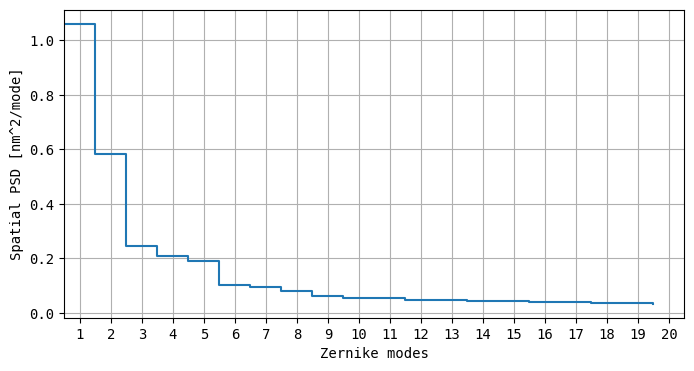

In [5]:
# %matplotlib widget

# Theoretical modal variance for the 21 modes
# From Noll 1976
noll_psd = np.array([1.03, 0.582, 0.134, 0.111, 0.0880, 0.0648, 0.0587, 0.0525, 0.0463, 0.0401, 
            0.0377, 0.0352, 0.0328, 0.0304,0.0279, 0.0267, 0.0255, 0.0243, 0.0232,
            0.0220, 0.0208])

# Interpreted manually from Winker 1991 Fig. 3
vK_005 = np.array([0.134 + 0.08*2, 0.134 + 0.08, 0.134, 0.111, 0.0880, 0.0648, 0.0587, 0.0525, 0.0463, 0.0401, 
            0.0377, 0.0352, 0.0328, 0.0304,0.0279, 0.0267, 0.0255, 0.0243, 0.0232,
            0.0220, 0.0208])

ncube_psd=100

zpols = get_zernike(wv, pup_wv, nzer, cobs=0.)
spsd = psd_spatial_zernike(wv, pup_wv, zpols, nzer_psd, ncube_psd)
spsd=np.float32(spsd) * 1e9**2

plt.figure(figsize=(8,4))
plt.grid(True), plt.grid(which='minor', linestyle=':')
x = np.arange(nzer_psd ) + .5
plt.plot(x, spsd / spsd[1] * 0.582, drawstyle='steps-post')
plt.xlabel('Zernike modes')
plt.ylabel('Spatial PSD [nm^2/mode]')
plt.xlim((.5, nzer_psd + .5))
plt.xticks(np.arange(nzer_psd) + 1);
plt.show()

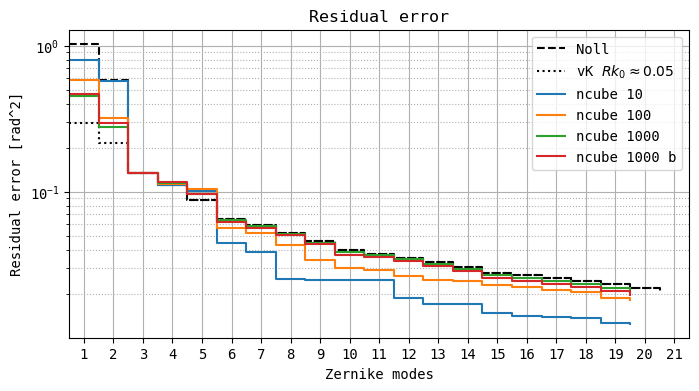

In [6]:
# -- Comparison with theory for different cube size used for the PSD calculation 
# also checking circular Zernike vs annular Zernike

zz = np.arange(len(noll_psd)) + 0.5

dd = 'wv/gox/'
psd_0 = fits.getdata(dd + 'cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20_ncube_10_var_circ.fits')
psd_1 = fits.getdata(dd + 'cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20_ncube_100_var_circ.fits')
psd_2 = fits.getdata(dd + 'cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20_ncube_100_var_cobs_025.fits')
psd_3 = fits.getdata(dd + 'cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20_ncube_1000.fits')
psd_4 = fits.getdata(dd + 'cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_spsd_20_ncube_1000_var_circ.fits') 

norm = 0.134
idd = 2
psd_0 /= psd_0[idd] / norm
psd_1 /= psd_1[idd] / norm
psd_2 /= psd_2[idd] / norm
psd_3 /= psd_3[idd+1] / norm
psd_4 /= psd_4[idd] / norm


plt.figure(figsize=(8,4))
plt.grid(True), plt.grid(which='minor', linestyle=':')
plt.plot(zz, noll_psd, drawstyle='steps-post', ls='--', color='k', label='Noll')
plt.plot(zz, vK_005, drawstyle='steps-post', ls=':', color='k', label=r'vK $Rk_0 \approx 0.05$')

plt.plot(zz[:-1], psd_0, drawstyle='steps-post', label='ncube 10')
plt.plot(zz[:-1], psd_1, drawstyle='steps-post', label='ncube 100')
# plt.plot(zz[:-1], psd_2, drawstyle='steps-post', label='cobs 0.25')
plt.plot(zz[:] - 1, psd_3, drawstyle='steps-post', label='ncube 1000')
plt.plot(zz[:-1], psd_4, drawstyle='steps-post', label='ncube 1000 b')


plt.semilogy()
plt.xlim((.5, len(noll_psd) + .5))
plt.xticks(np.arange(len(noll_psd)) + 1);
plt.legend()
plt.xlabel('Zernike modes')
plt.ylabel('Residual error [rad^2]')
plt.title('Residual error')

plt.show()


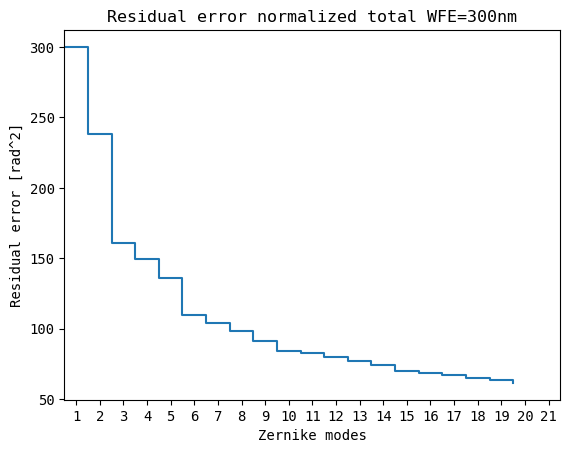

Residual WFE tiptilt removed : 160.6nm


In [7]:
# Residual variance after subtracting N Zernike modes

wfe_tot = 300
psd_4_norm = psd_4 / np.sum(psd_4[0]) * wfe_tot**2
plt.figure()
plt.plot(zz[:-1], np.sqrt(psd_4_norm), drawstyle='steps-post', label='ncube 1000 b')
plt.xlim((.5, len(noll_psd) + .5))
plt.xticks(np.arange(len(noll_psd)) + 1);
plt.xlabel('Zernike modes')
plt.ylabel('Residual error [rad^2]')
plt.title('Residual error normalized total WFE={0:.0f}nm'.format(wfe_tot))
plt.show()


print('Residual WFE tiptilt removed : {0:.1f}nm'.format(np.sqrt(psd_4_norm[2])))

### One frame example

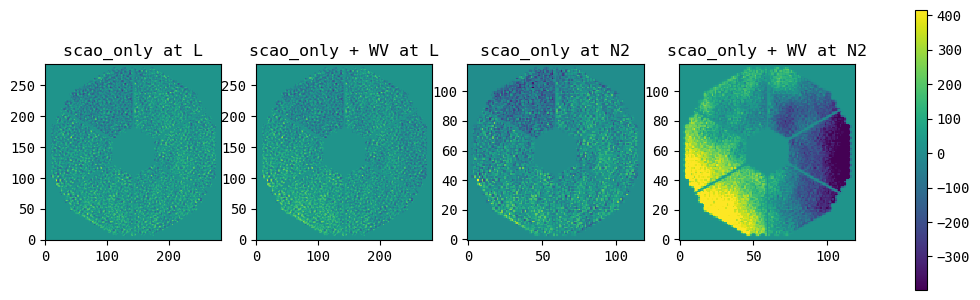

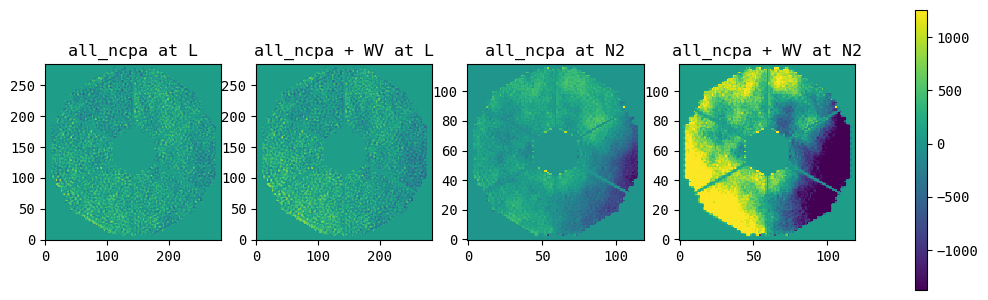

In [14]:
%matplotlib inline 

i = 20 # frame number
j = step*i
for case in ['scao_only', 'all_ncpa']:
    scao_L = fits.getdata(scao%(case,'L',npupil_L))[i]*1e9
    scao_N = fits.getdata(scao%(case,'N2',npupil_N))[i]*1e9
    wv_L = resize_img(fits.getdata(wv)[j], npupil_L)*(scaling_L*1e9)
    wv_N = resize_img(fits.getdata(wv)[j], npupil_N)*(scaling_N*1e9)
    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,4))
    plt.subplot(141); plt.title('%s at L'%case)
    im = plt.imshow(scao_L, origin='lower')
    vmin, vmax = plt.gci().get_clim()
    plt.subplot(142); plt.title('%s + WV at L'%case)
    plt.imshow(scao_L + wv_L, origin='lower', vmin=vmin, vmax=vmax)
    plt.subplot(143); plt.title('%s at N2'%case)
    im = plt.imshow(scao_N, origin='lower')
    plt.subplot(144); plt.title('%s + WV at N2'%case)
    plt.imshow(scao_N + wv_N, origin='lower', vmin=vmin, vmax=vmax)
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.7])
    fig.colorbar(im, cax=cbar_ax);

plt.show()

### Zernike fitting

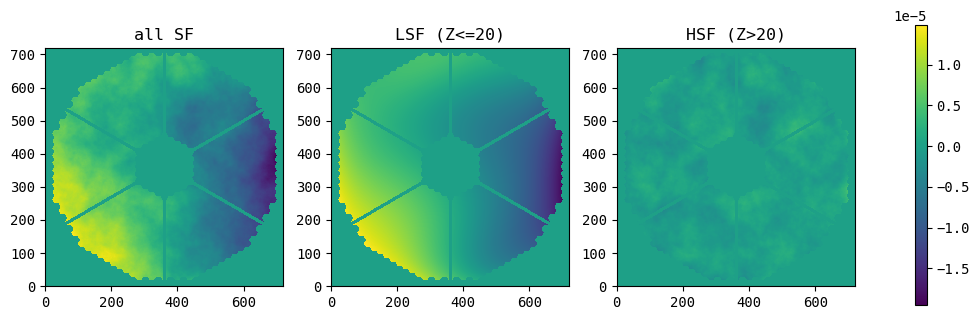

In [17]:
spsd_name = wv[:-5] + '_%s' + '_%s.fits'%nzer_psd
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12,4))
plt.subplot(131); im = plt.imshow(fits.getdata(wv)[j], origin='lower'); plt.title('all SF')
vmin, vmax = plt.gci().get_clim()
plt.subplot(132); plt.title('LSF (Z<=%s)'%nzer_psd)
plt.imshow(fits.getdata(spsd_name%'LSFs')[-1,j], origin='lower', vmin=vmin, vmax=vmax)
plt.subplot(133); plt.title('HSF (Z>%s)'%nzer_psd)
plt.imshow(fits.getdata(spsd_name%'HSFs')[-1,j], origin='lower', vmin=vmin, vmax=vmax)
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.7])
fig.colorbar(im, cax=cbar_ax);

plt.show()

### Temporal PSD

getdata cfull/cube_Cfull_20220512_3600s_300ms_0piston_meters_scao_only_L_285_zpols_100.fits
getdata wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100.fits


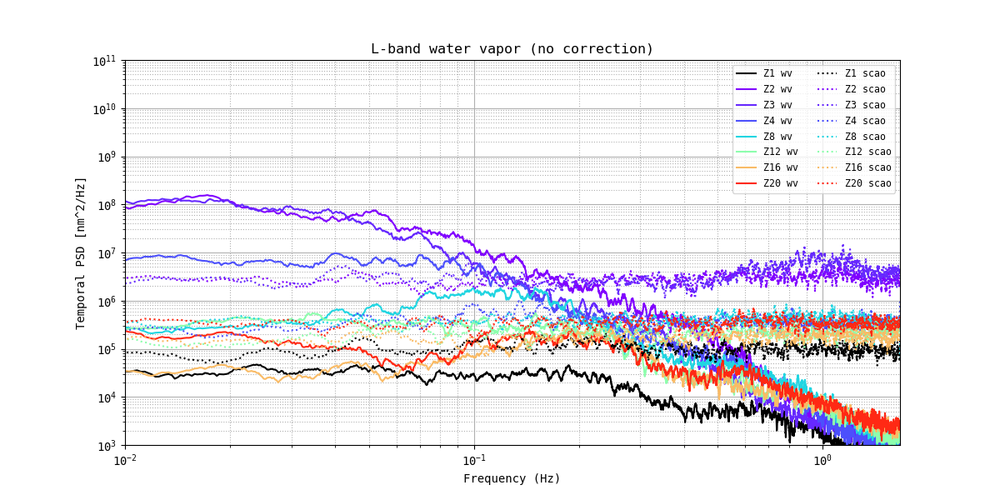

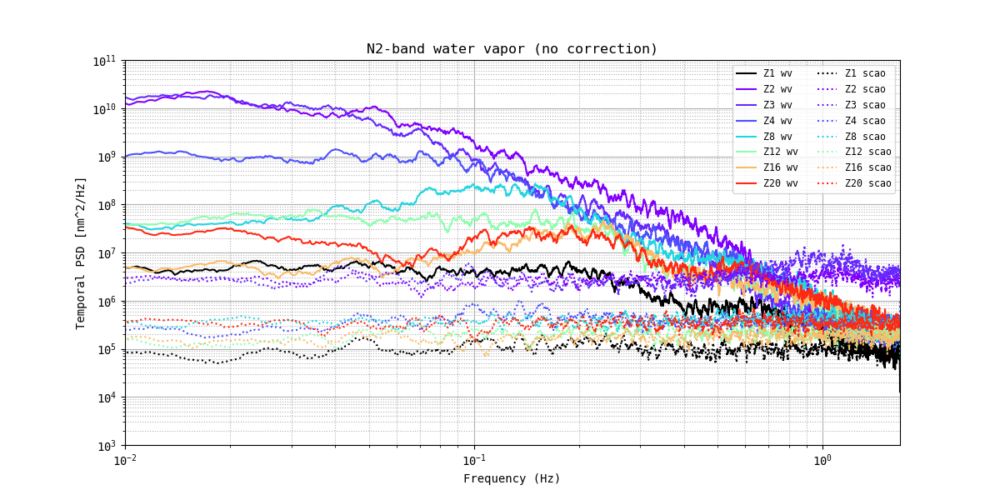

In [11]:
tpsd_scao = psd_temporal(get_zernike(scao%('scao_only','L',npupil_L), pup_scao, nzer)[:,:nzer_psd])*1e9**2
tpsd_wv = psd_temporal(get_zernike(wv, pup_wv, nzer)[::step,:nzer_psd])*1e9**2
tpsd_wvl = tpsd_wv*scaling_L**2
tpsd_wvn = tpsd_wv*scaling_N**2
plot_tpsd(tpsd_wvl, 'wv', tpsd_scao, 'scao', 'L-band water vapor (no correction)')
plot_tpsd(tpsd_wvn, 'wv', tpsd_scao, 'scao', 'N2-band water vapor (no correction)')

# 2/ Rolling average correction

In [25]:
freqs = [(1,1), (1,10), (1,100)]
for nLF, nHF in freqs:
    get_zpols_roll(zpols, nLF, nHF)

write to wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_1.fits
write to wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_10.fits
write to wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_100.fits


### Temporal PSD

In [26]:
zpols_roll_1 = fits.getdata(wv[:-5] + '_zpols_100_nLF_1_nHF_1.fits')
zpols_roll_10 = fits.getdata(wv[:-5] + '_zpols_100_nLF_1_nHF_10.fits')
zpols_roll_100 = fits.getdata(wv[:-5] + '_zpols_100_nLF_1_nHF_100.fits')
tpsd_wv = psd_temporal((zpols - zpols_roll_10)[::step,:nzer_psd])*1e9**2
tpsd_wvl = tpsd_wv*scaling_L**2
tpsd_wvn = tpsd_wv*scaling_N**2
plot_tpsd(tpsd_wvl, 'wv', tpsd_scao, 'scao', 'L-band rolling average correction: QACITS 10Hz + PSI 1Hz')
plot_tpsd(tpsd_wvn, 'wv', tpsd_scao, 'scao', 'N2-band rolling average correction: QACITS 10Hz + PSI 1Hz')

NameError: name 'tpsd_scao' is not defined

### WFE for Zernikes 4-100

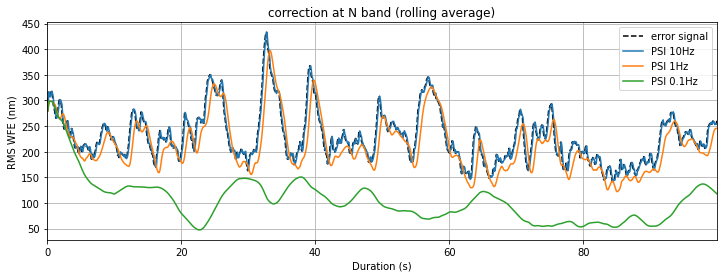

In [11]:
scaling = scaling_N*1e9
nframes = 1000
ts = np.arange(nframes)*samp_wv/1e3
m = range(3,nzer)
plt.figure(figsize=(12,4))
plt.plot(ts, np.sqrt(np.sum(zpols[:nframes,m]**2,1))*scaling, label='error signal', color='k', linestyle='--')
plt.plot(ts, np.sqrt(np.sum(zpols_roll_1[:nframes,m]**2,1))*scaling, label='PSI 10Hz')
plt.plot(ts, np.sqrt(np.sum(zpols_roll_10[:nframes,m]**2,1))*scaling, label='PSI 1Hz')
plt.plot(ts, np.sqrt(np.sum(zpols_roll_100[:nframes,m]**2,1))*scaling, label='PSI 0.1Hz')
plt.legend(); plt.grid('on')
plt.title('correction at N band (rolling average)')
plt.xlabel('Duration (s)')
plt.ylabel('RMS WFE (nm)')
plt.xlim((0, ts[-1]));

# 3/ Closed-loop control with an integrator

In [12]:
for G in [.2, .4, .6, .8, 1]:
    get_zpols_integ(zpols, 1, 1, G)
    get_zpols_integ(zpols, 1, 10, G)
    get_zpols_integ(zpols, 3, 3, G)
    get_zpols_integ(zpols, 10, 10, G)

already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_1_G_0.2.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_10_G_0.2.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_3_nHF_3_G_0.2.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.2.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_1_G_0.4.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_10_G_0.4.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_3_nHF_3_G_0.4.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.4.fits
already exists: wv/cube_Cbasic_20210601_3600s_100ms_0pisto

### Temporal PSD for QACITS

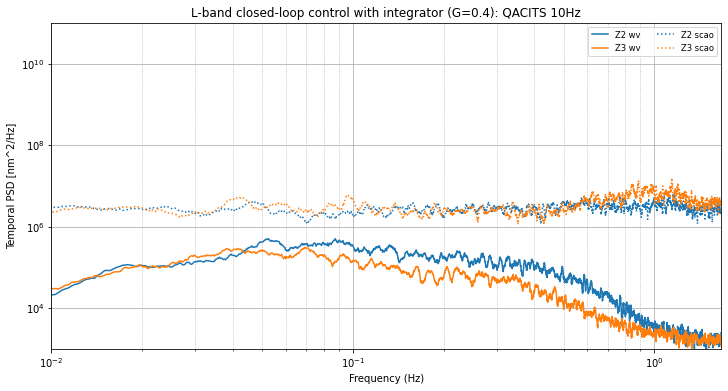

In [13]:
zpols_integ_04 = fits.getdata(wv[:-5] + '_zpols_100_nLF_1_nHF_10_G_0.4.fits')
tpsd_wv = psd_temporal((zpols - zpols_integ_04)[::step,:nzer_psd])*1e9**2
tpsd_wvl = tpsd_wv*scaling_L**2
plot_tpsd(tpsd_wvl, 'wv', tpsd_scao, 'scao', 'L-band closed-loop control with integrator (G=0.4): QACITS 10Hz',
          z=[2,3], man_colors=['k','C0','C1'])

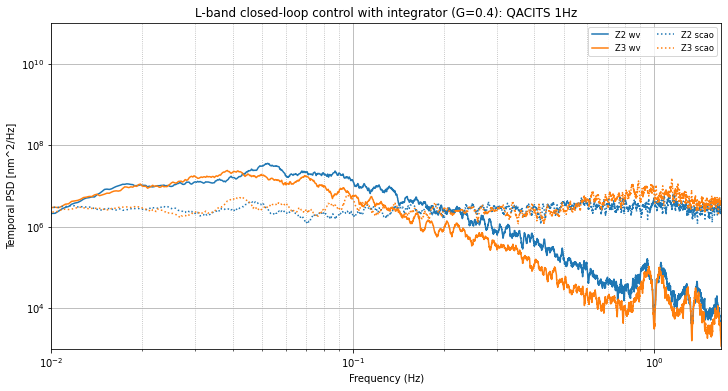

In [14]:
zpols_integ_04 = fits.getdata(wv[:-5] + '_zpols_100_nLF_10_nHF_10_G_0.4.fits')
tpsd_wv = psd_temporal((zpols - zpols_integ_04)[::step,:nzer_psd])*1e9**2
tpsd_wvl = tpsd_wv*scaling_L**2
plot_tpsd(tpsd_wvl, 'wv', tpsd_scao, 'scao', 'L-band closed-loop control with integrator (G=0.4): QACITS 1Hz',
          z=[2,3], man_colors=['k','C0','C1'])

### Temporal PSD for PSI

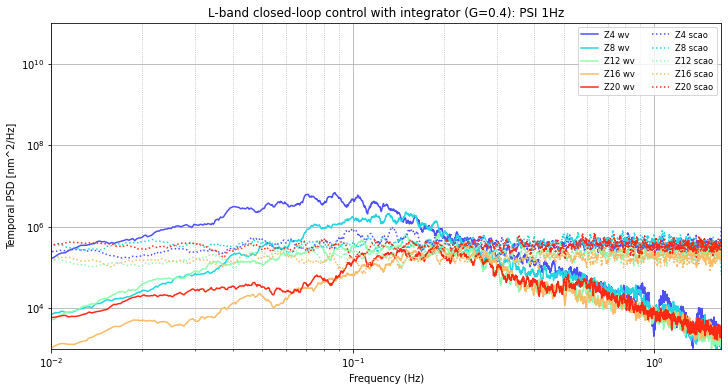

In [15]:
zpols_integ_04 = fits.getdata(wv[:-5] + '_zpols_100_nLF_1_nHF_10_G_0.4.fits')
tpsd_wv = psd_temporal((zpols - zpols_integ_04)[::step,:nzer_psd])*1e9**2
tpsd_wvl = tpsd_wv*scaling_L**2
plot_tpsd(tpsd_wvl, 'wv', tpsd_scao, 'scao', 'L-band closed-loop control with integrator (G=0.4): PSI 1Hz',
          z=[4,8,12,16,20])

### Tip-tilt at 10 Hz

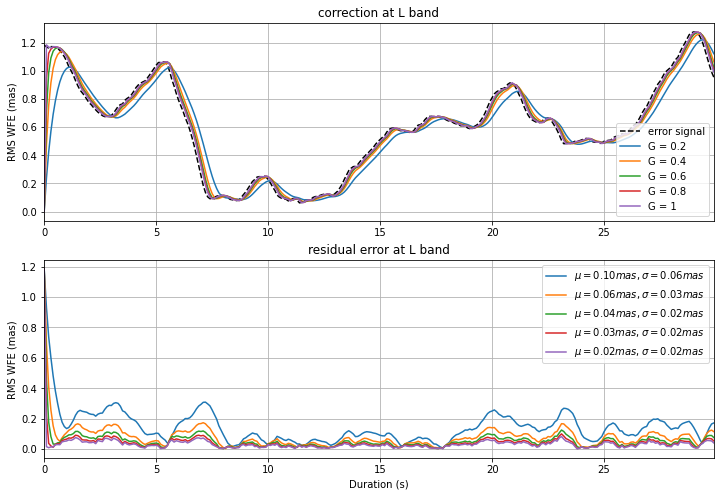

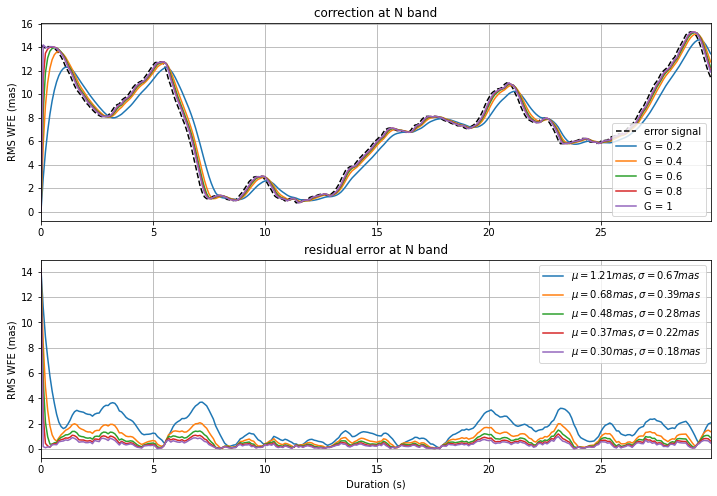

In [16]:
nframes = 300
plot_integ(nframes, range(1,3), 'L', nLF=1, nHF=1, yunits='mas')
plot_integ(nframes, range(1,3), 'N', nLF=1, nHF=1, yunits='mas')

### Tip-tilt at 3.33 Hz

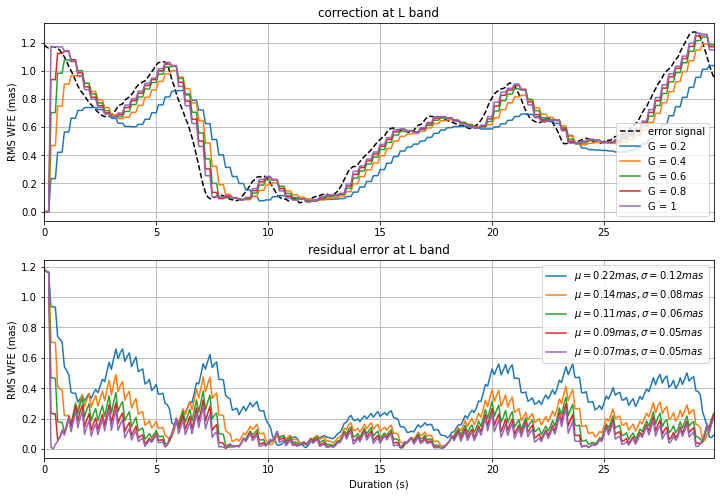

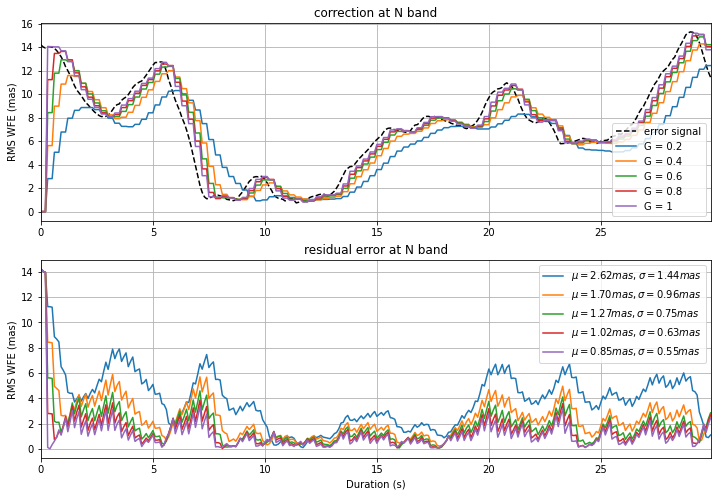

In [17]:
plot_integ(nframes, range(1,3), 'L', nLF=3, nHF=3, yunits='mas')
plot_integ(nframes, range(1,3), 'N', nLF=3, nHF=3, yunits='mas')

### Tip-tilt at 1 Hz

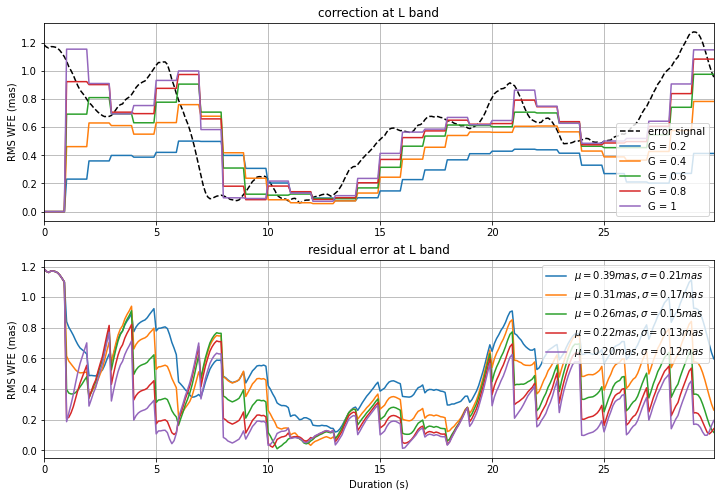

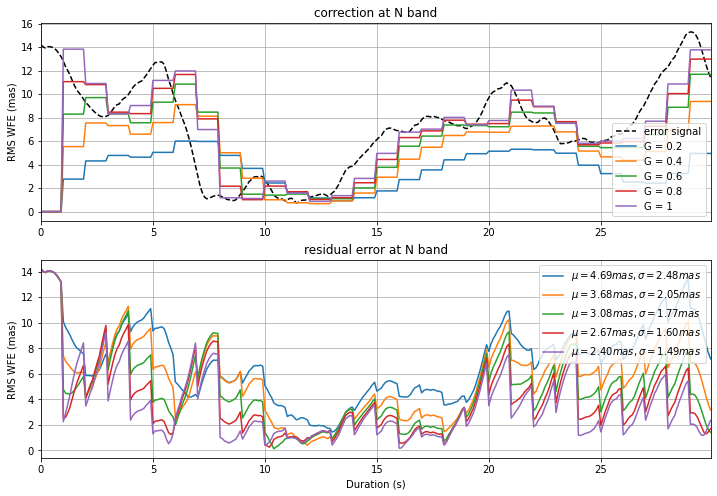

In [18]:
plot_integ(nframes, range(1,3), 'L', nLF=10, nHF=10, yunits='mas')
plot_integ(nframes, range(1,3), 'N', nLF=10, nHF=10, yunits='mas')

### Zernikes 4-100 at 10 Hz

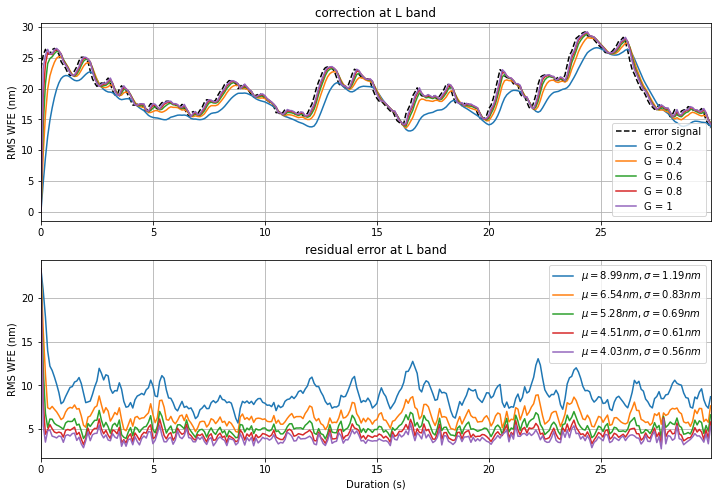

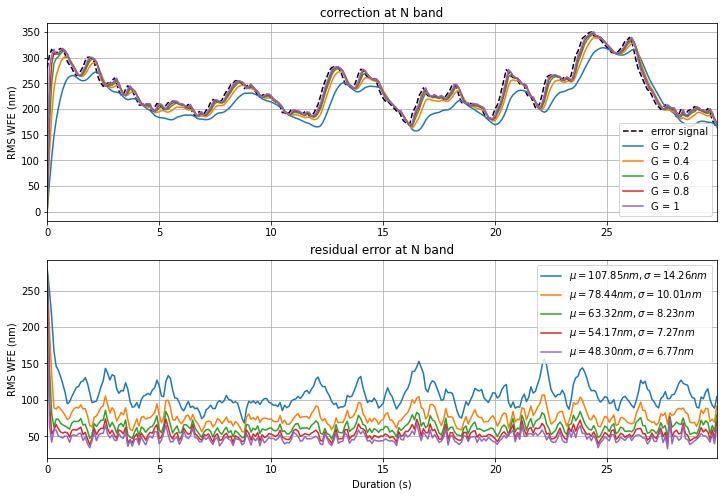

In [19]:
plot_integ(nframes, range(3,nzer), 'L', nLF=1, nHF=1)
plot_integ(nframes, range(3,nzer), 'N', nLF=1, nHF=1)

### Zernikes 4-100 at 3.33 Hz

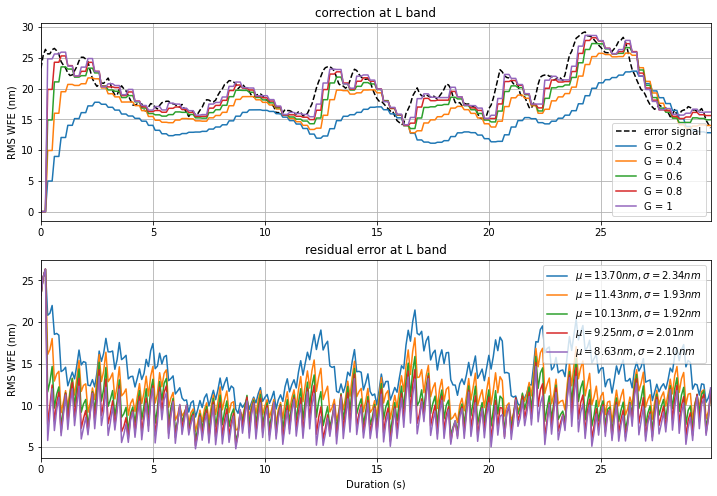

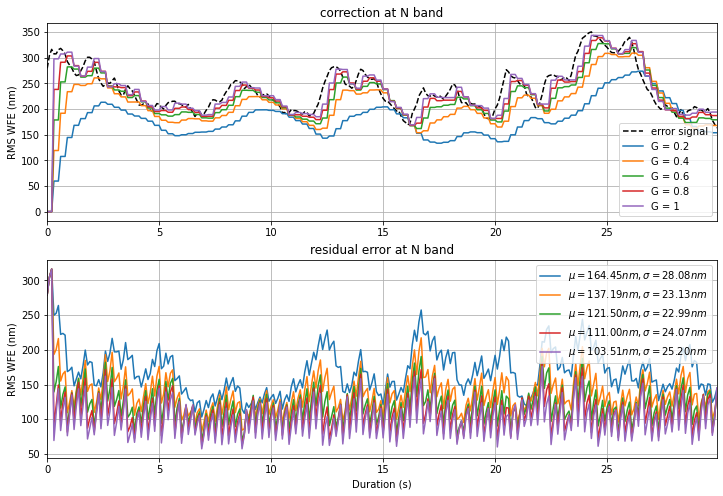

In [20]:
plot_integ(nframes, range(3,nzer), 'L', nLF=3, nHF=3)
plot_integ(nframes, range(3,nzer), 'N', nLF=3, nHF=3)

### Zernikes 4-100 at 1 Hz

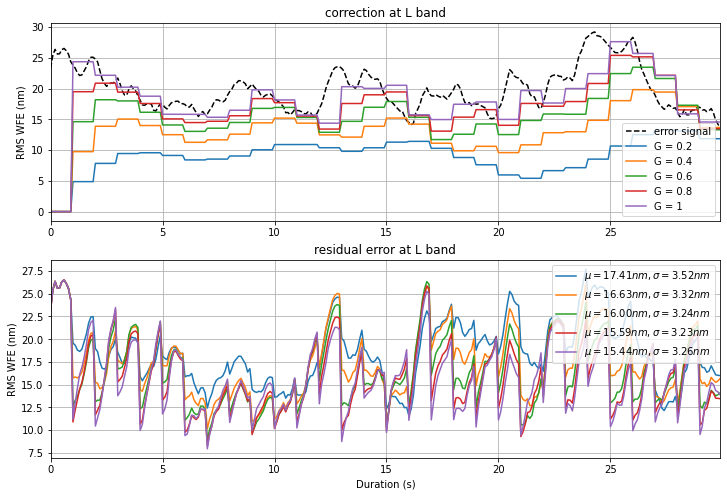

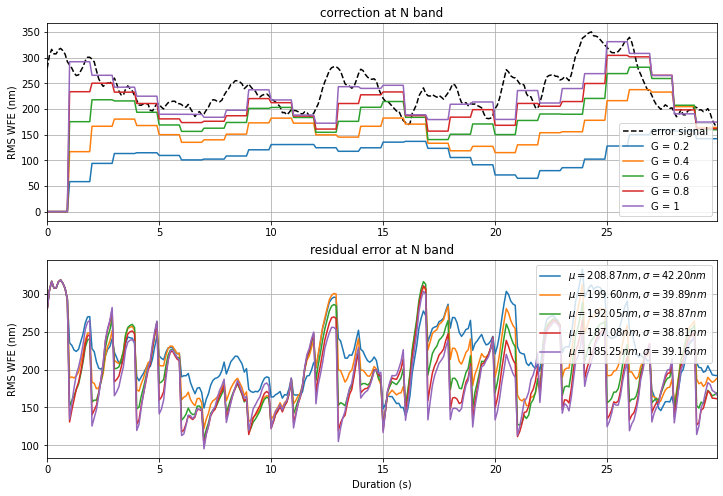

In [21]:
plot_integ(nframes, range(3,nzer), 'L', nLF=10, nHF=10)
plot_integ(nframes, range(3,nzer), 'N', nLF=10, nHF=10)

# 4/ Closed-loop + gaussian noise

In [22]:
for S in [0, 1, 2, 3, 4, 5, 10, 15, 20, 25]:
#    get_zpols_integ_scaled(zpols, 'L', 1, 1, 0.4, S)
#    get_zpols_integ_scaled(zpols, 'L', 3, 3, 0.4, S)
    get_zpols_integ_scaled(zpols, 'L', 10, 10, 0.4, S)
for S in [0, 2, 4, 6, 8, 10, 20, 30, 40, 50]:
#    get_zpols_integ_scaled(zpols, 'N', 1, 1, 0.4, S)
#    get_zpols_integ_scaled(zpols, 'N', 3, 3, 0.4, S)
    get_zpols_integ_scaled(zpols, 'N', 10, 10, 0.4, S)

write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_0.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_1.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_2.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_3.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_4.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_5.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_10.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WVL_zpols_100_nLF_10_nHF_10_G_0.4_S_15.fits
write to wv/cube_Cbasic_20210601_3600s_100ms_0piston_meters_sc

### Tip-tilt at 1 Hz (G = 0.4)

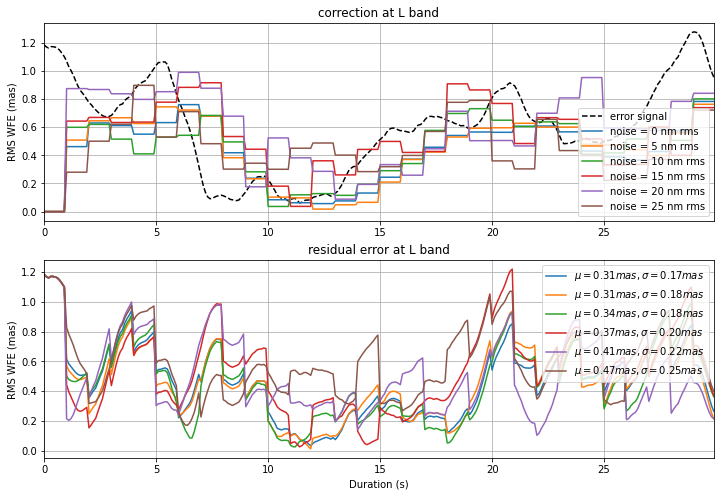

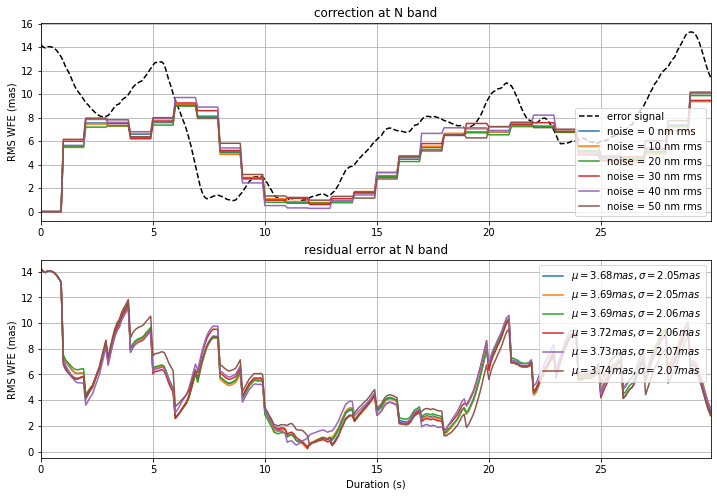

In [23]:
plot_integ_noise(nframes, range(1,3), 'L', nLF=10, nHF=10, G=.4, yunits='mas', Ss=[0,5,10,15,20,25])
plot_integ_noise(nframes, range(1,3), 'N', nLF=10, nHF=10, G=.4, yunits='mas', Ss=[0,10,20,30,40,50])

### Zernikes 4-100 at 1 Hz (G = 0.4)

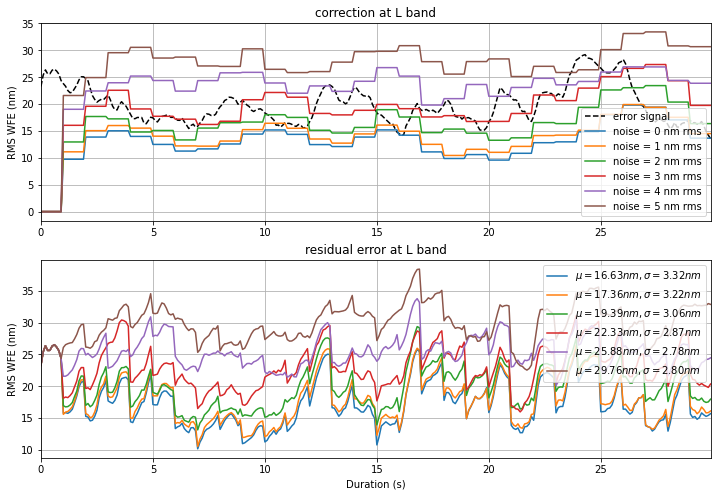

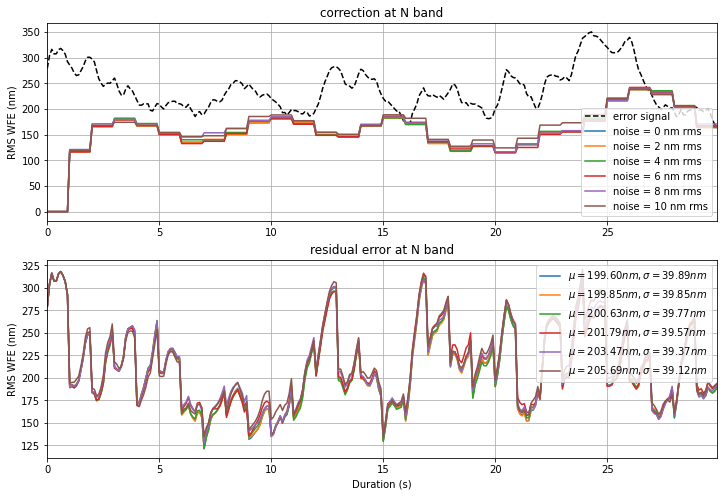

In [24]:
plot_integ_noise(nframes, range(3,100), 'L', nLF=10, nHF=10, G=.4, Ss=[0,1,2,3,4,5])
plot_integ_noise(nframes, range(3,100), 'N', nLF=10, nHF=10, G=.4, Ss=[0,2,4,6,8,10])

# 5/ Closed-loop + lag

In [9]:
subdir = ''
lags = np.array([0, 1, 2, 3, 4, 5, 10])
gains = np.round(1 / (1 + lags), 2)
gains_1Hz = np.round(1 / (1 + lags/10), 2)

print(gains)
zpols = get_zernike(wv, pup_wv, nzer, cobs=0.)

for gain, lag in zip(gains, lags):
    get_zpols_integ_lag(zpols, 1, 1, gain, lag, subdir=subdir)
    get_zpols_integ_lag(zpols, 3, 3, gain, lag, subdir=subdir)
    get_zpols_integ_lag(zpols, 10, 10, gain, lag, subdir=subdir)

for gain, lag in zip(gains_1Hz, lags):
    get_zpols_integ_lag(zpols, 10, 10, gain, lag, subdir=subdir)


[1.   0.5  0.33 0.25 0.2  0.17 0.09]
getdata wv/gox/cube_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_1_G_1.0_lag_0.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_3_nHF_3_G_1.0_lag_0.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_1.0_lag_0.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_1_nHF_1_G_0.5_lag_1.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_3_nHF_3_G_0.5_lag_1.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.5_lag_1.fits
already exists: wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_1

write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.91_lag_1.fits
write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.83_lag_2.fits
write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.77_lag_3.fits
write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.71_lag_4.fits
write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.67_lag_5.fits
write to wv/gox//zern_Cbasic_20210601_3600s_100ms_0piston_meters_scao_only_720_WV_zpols_100_nLF_10_nHF_10_G_0.5_lag_10.fits


### Tip-tilt at 10 Hz (G = 1 / (1 + lag))

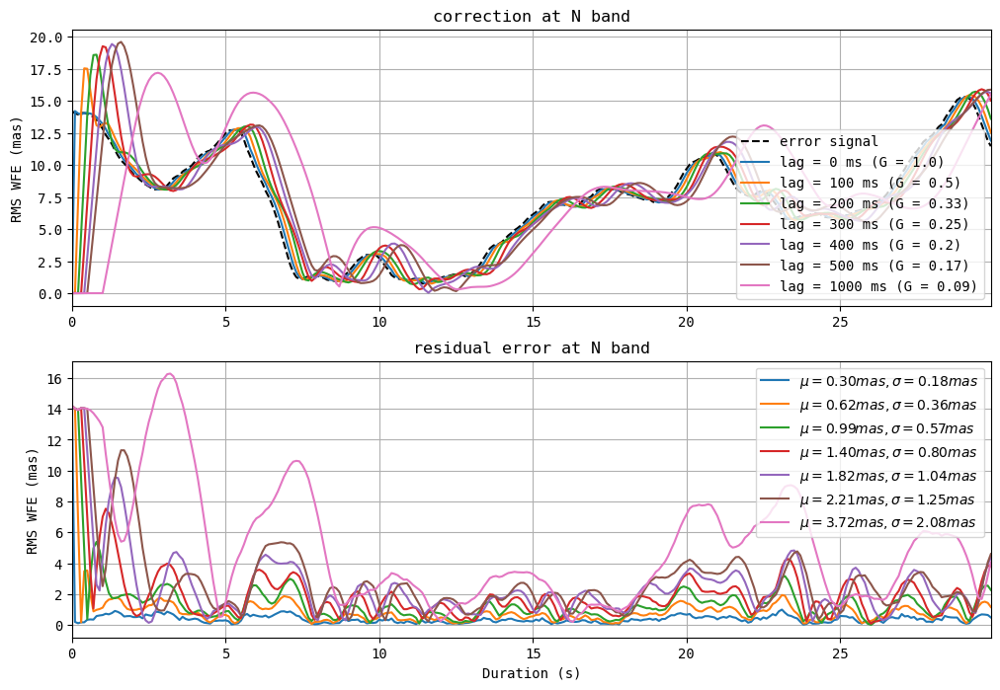

In [7]:
# plt.show()
nframes=300
plot_integ_lag(nframes, range(1,3), 'N', nLF=1, nHF=1, yunits='mas', 
               G=list(gains), lags=lags, subdir='')
plt.show()

### Tip-tilt at 3.33 Hz (G = 1 / (1 + lag))

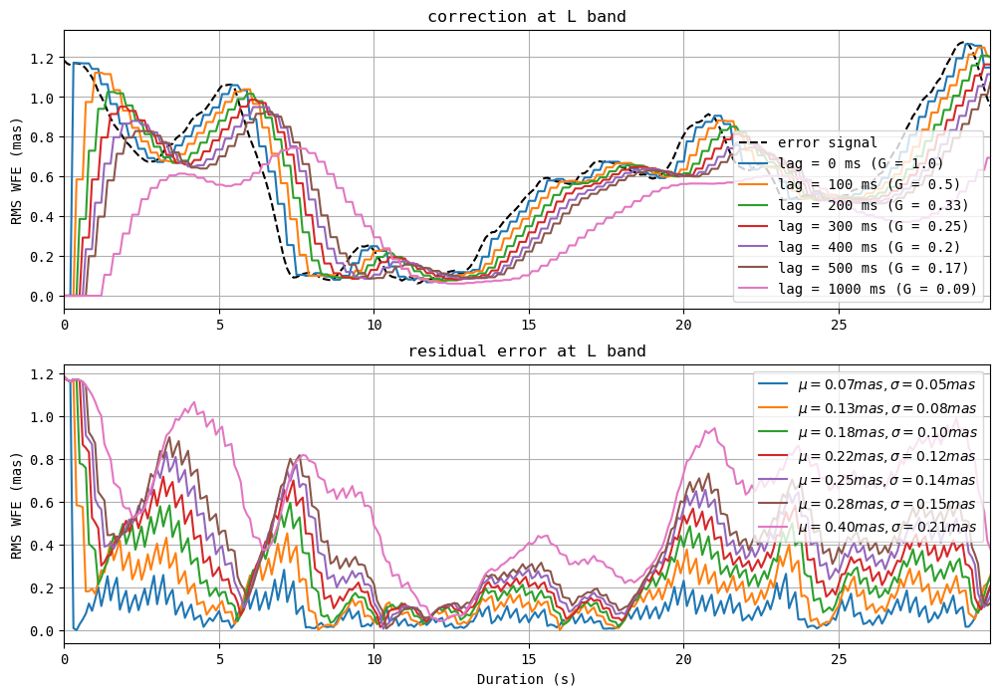

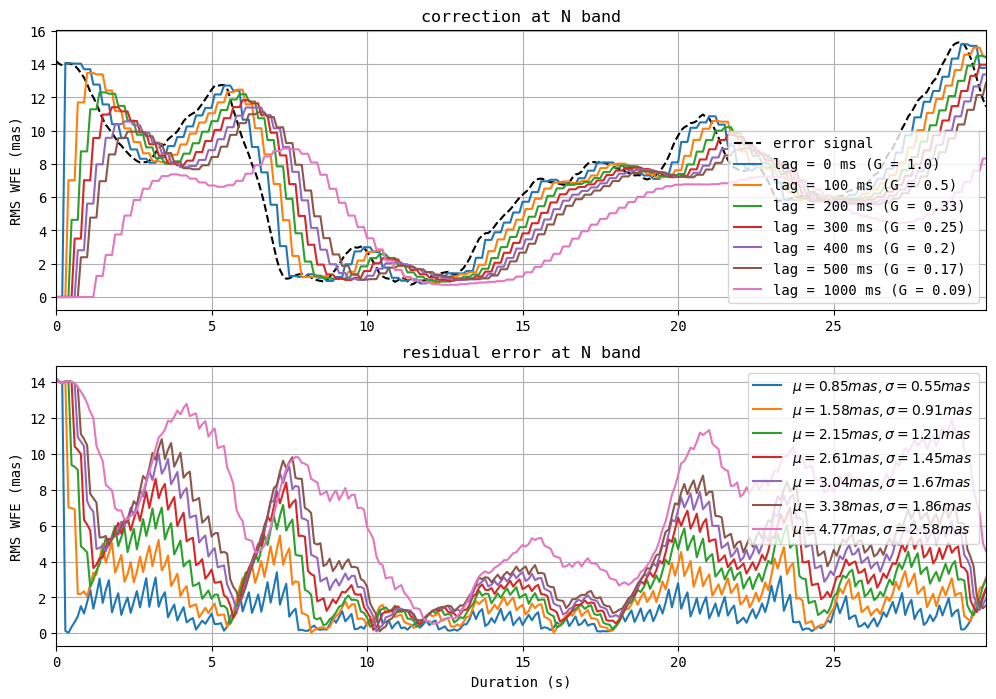

In [13]:
plot_integ_lag(nframes, range(1,3), 'L', nLF=3, nHF=3, G=list(gains), lags=lags, yunits='mas')
plt.show()
plot_integ_lag(nframes, range(1,3), 'N', nLF=3, nHF=3, G=list(gains), lags=lags, yunits='mas')
plt.show()

### Tip-tilt at 1 Hz (G = 1 / (1 + lag))

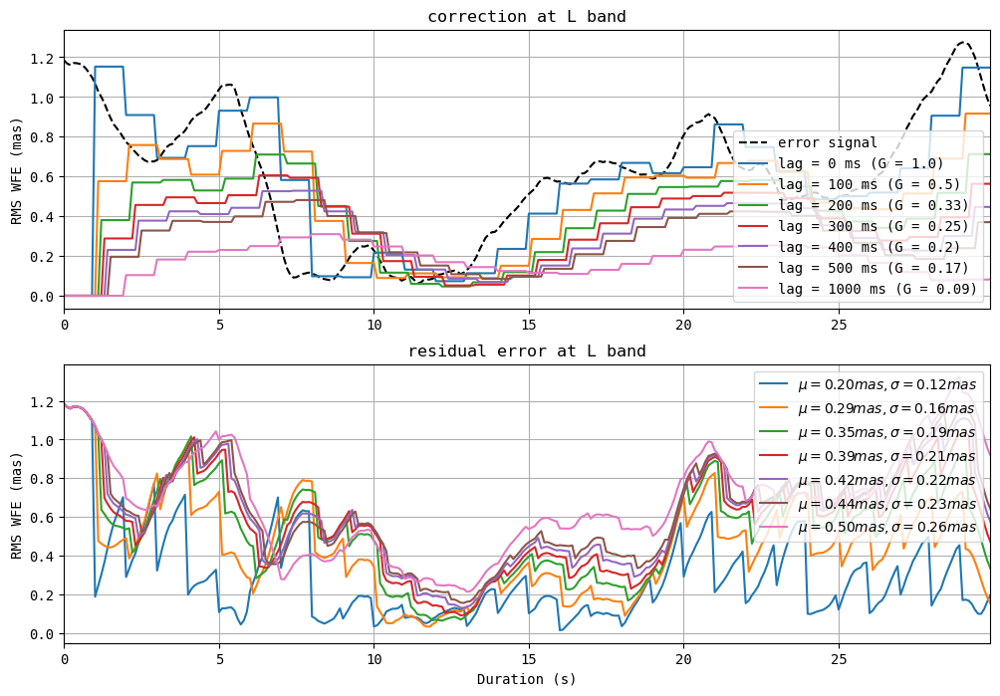

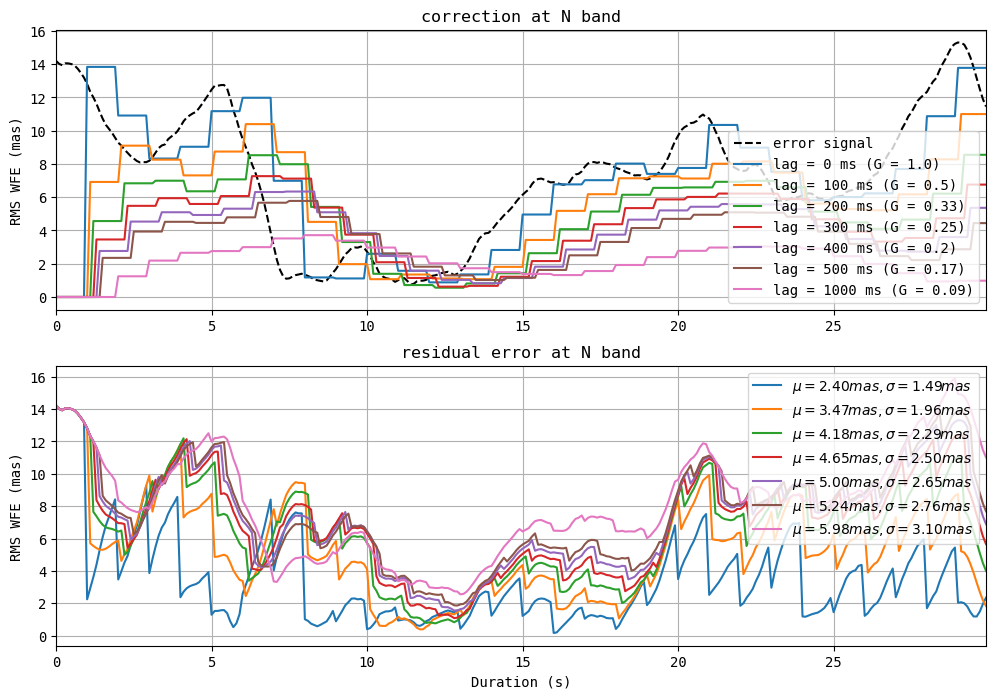

In [14]:
plot_integ_lag(nframes, range(1,3), 'L', nLF=10, nHF=10, G=list(gains), lags=lags, yunits='mas')
plt.show()
plot_integ_lag(nframes, range(1,3), 'N', nLF=10, nHF=10, G=list(gains), lags=lags, yunits='mas')
plt.show()

### Zernikes 4-100 at 1 Hz (G = 1 / (1 + lag))

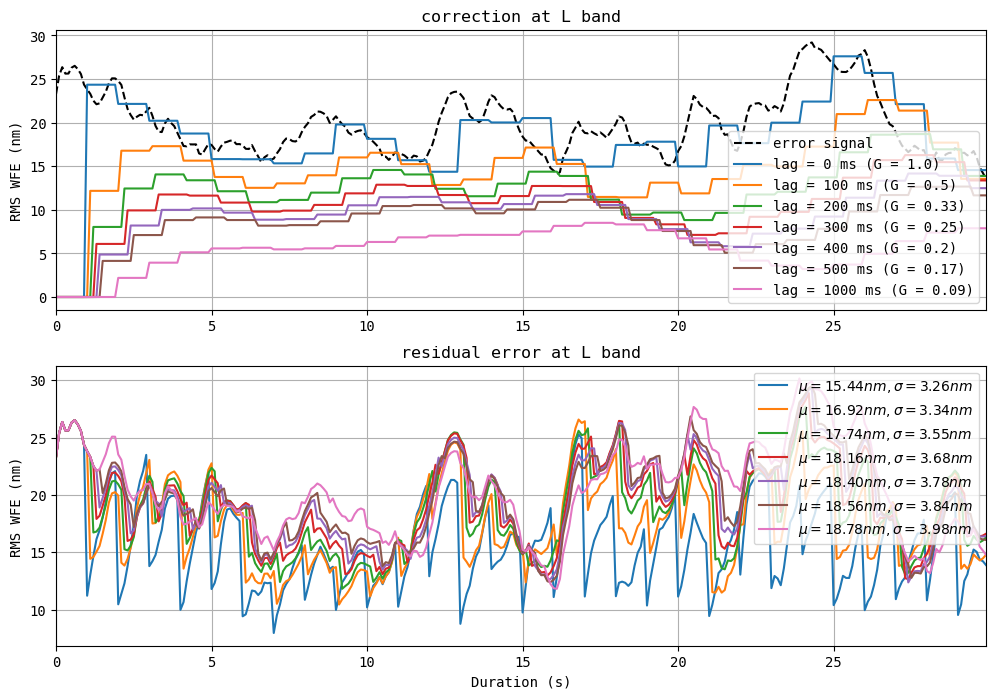

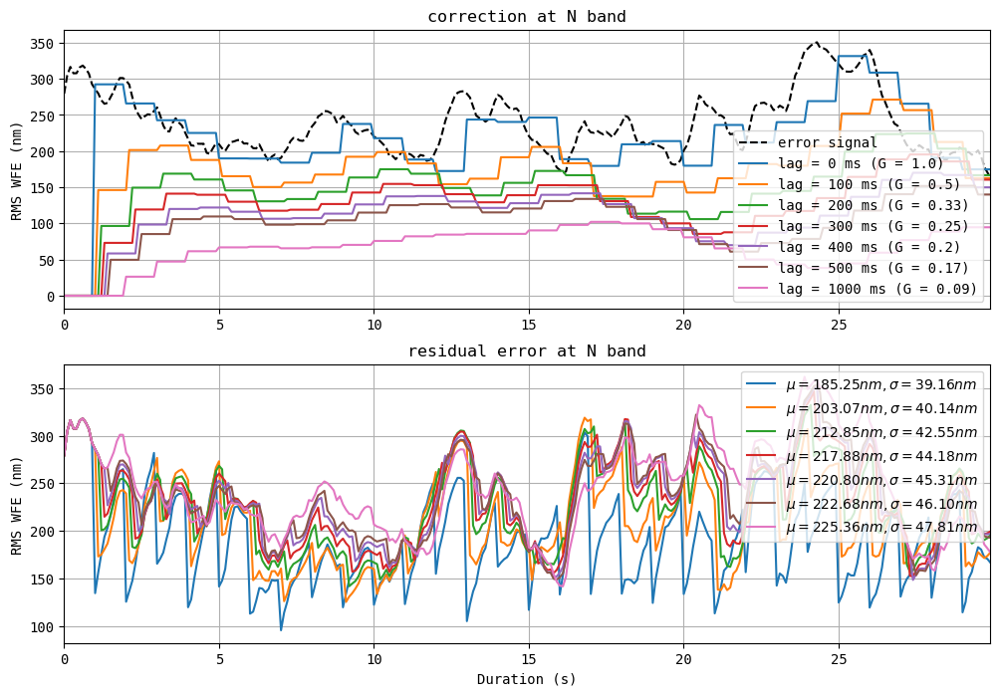

In [ ]:
plot_integ_lag(nframes, range(3,100), 'L', nLF=10, nHF=10, G=list(gains), lags=lags,)
plt.show()
plot_integ_lag(nframes, range(3,100), 'N', nLF=10, nHF=10, G=list(gains), lags=lags,)
plt.show()

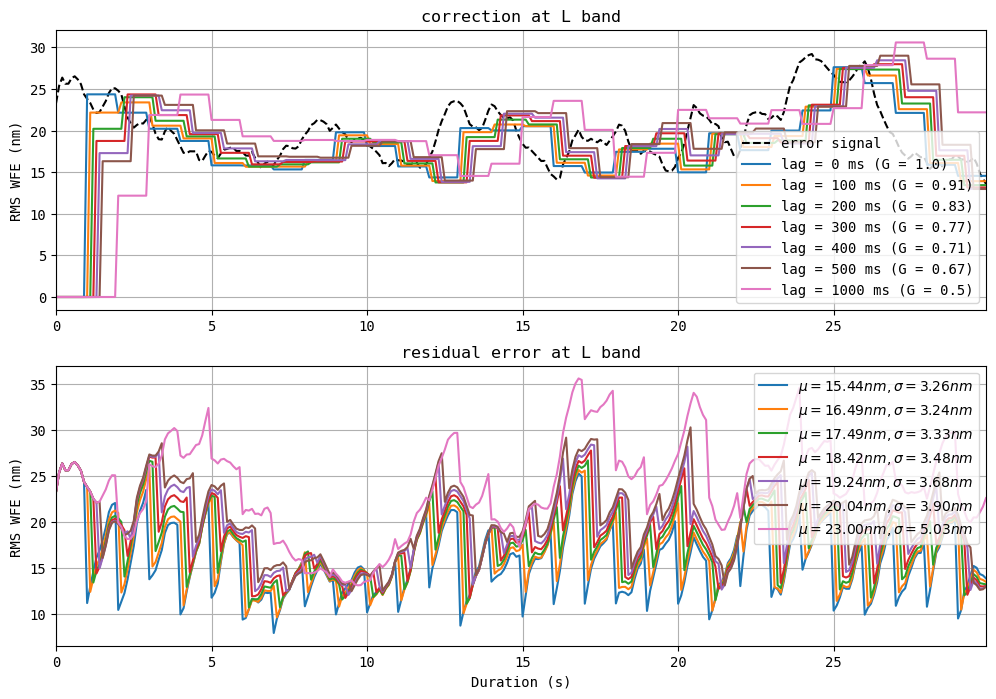

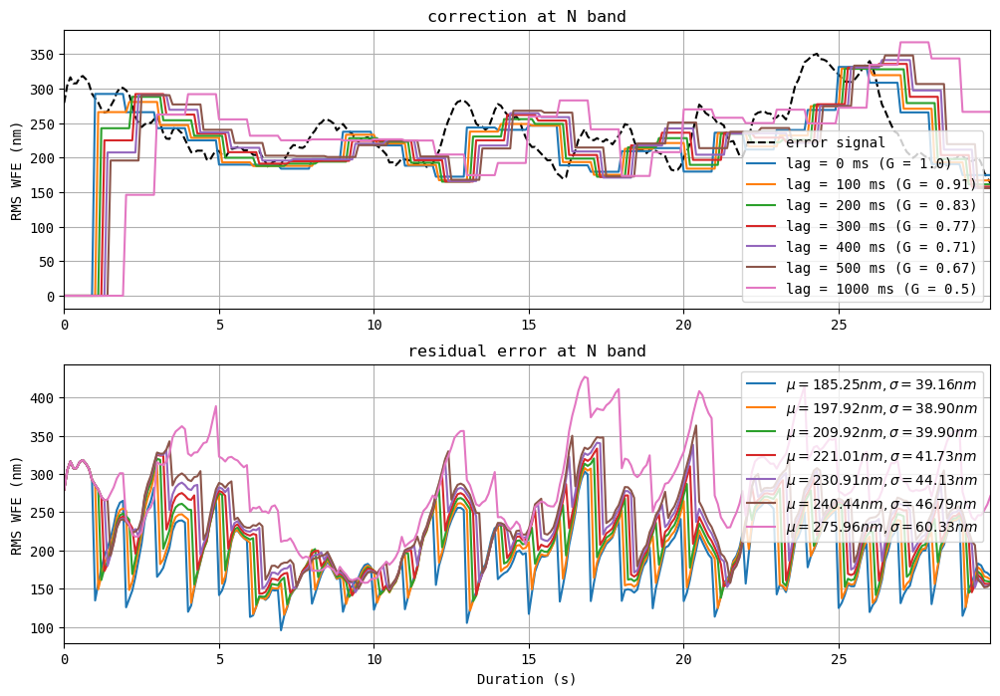

In [ ]:
## Optimize gain for 1Hz and lags going from 0 to 1000ms
plot_integ_lag(nframes, range(3,100), 'L', nLF=10, nHF=10, G=list(gains_1Hz), lags=lags)
plt.show()
plot_integ_lag(nframes, range(3,100), 'N', nLF=10, nHF=10, G=list(gains_1Hz), lags=lags)
plt.show()

### Zernikes 4-100 at 3.33 Hz (G = 1 / (1+lag))

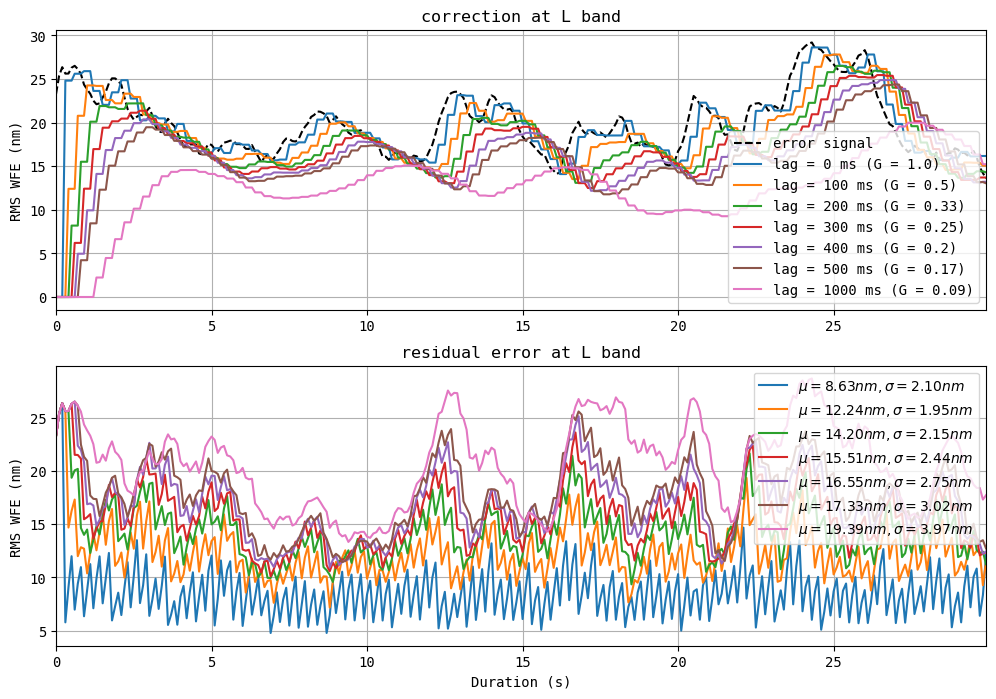

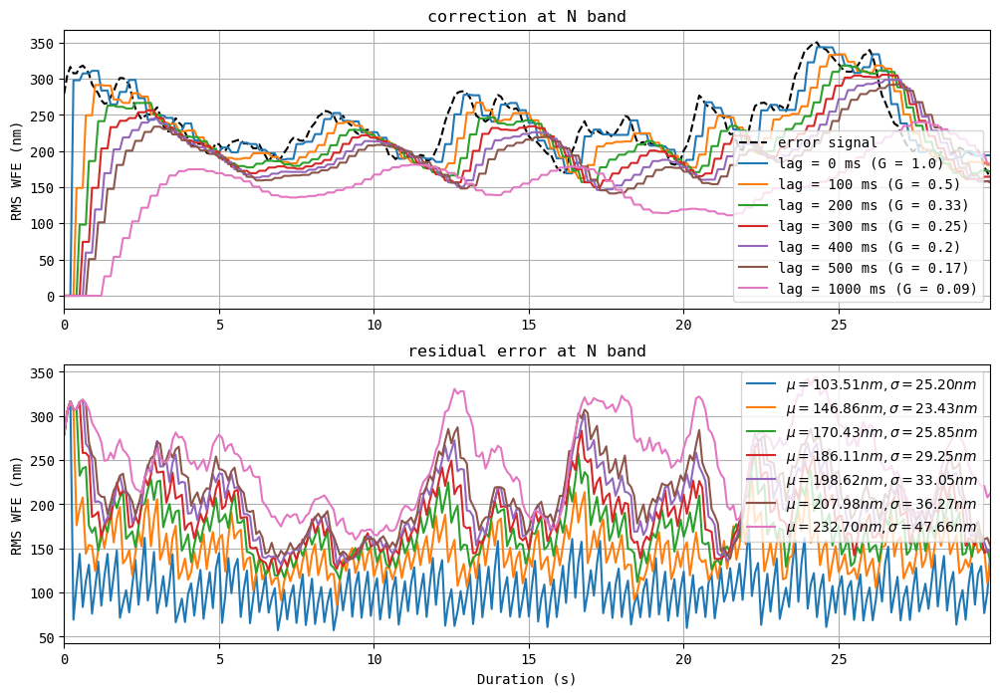

In [16]:
plot_integ_lag(nframes, range(3,100), 'L', nLF=3, nHF=3, G=list(gains), lags=lags)
plt.show()
plot_integ_lag(nframes, range(3,100), 'N', nLF=3, nHF=3, G=list(gains), lags=lags)
plt.show()

### Zernikes 4-100 at 10 Hz (G = 0.4)

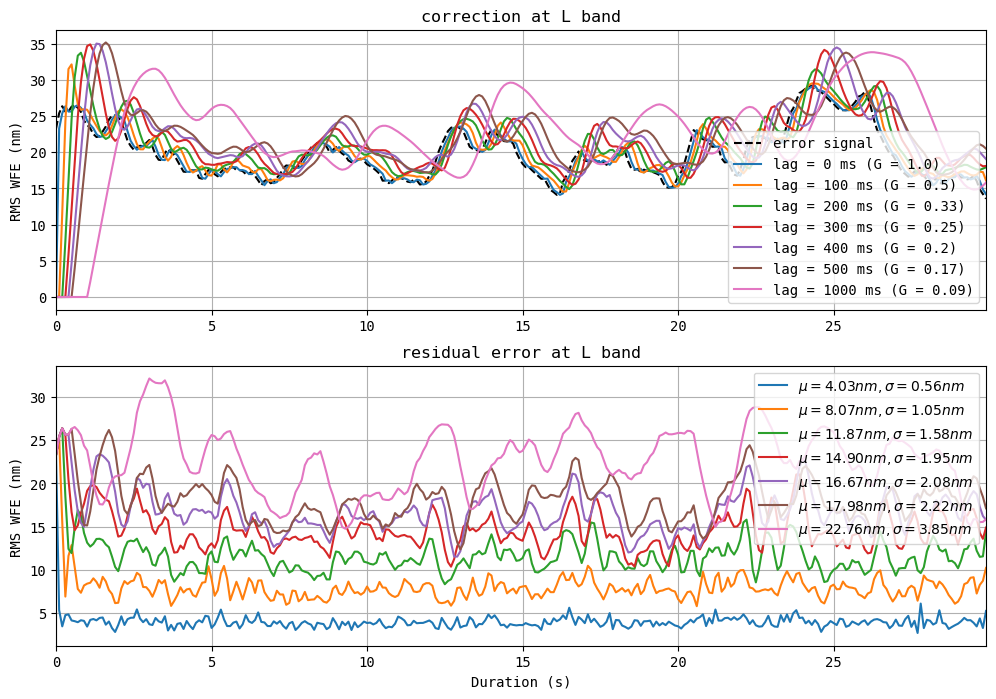

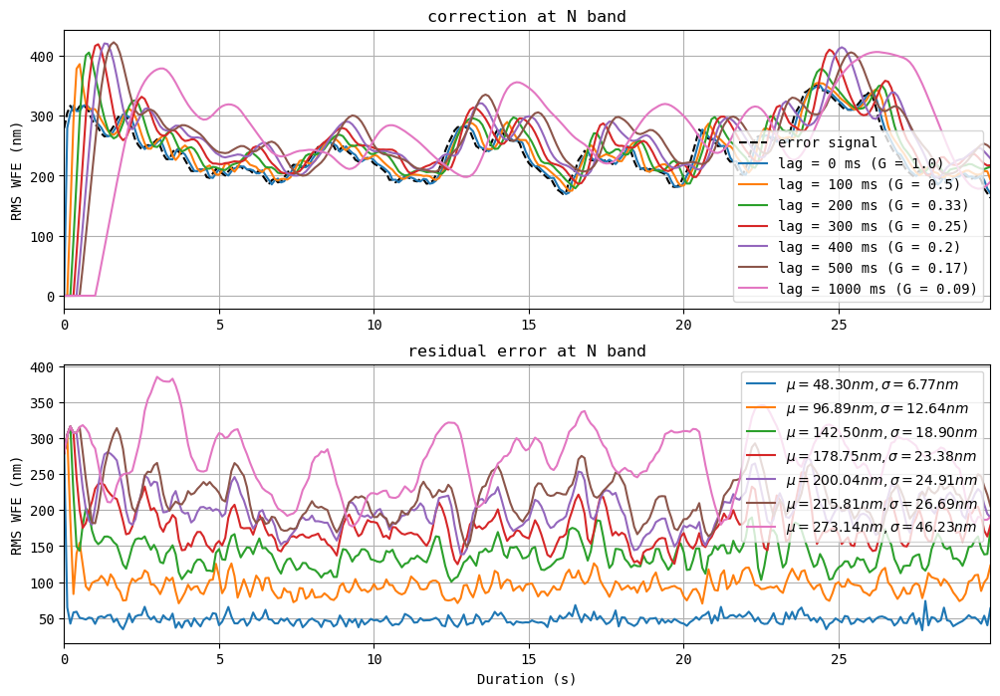

In [10]:
plot_integ_lag(nframes, range(3,100), 'L', nLF=1, nHF=1, G=list(gains), lags=lags)
plt.show()
plot_integ_lag(nframes, range(3,100), 'N', nLF=1, nHF=1, G=list(gains), lags=lags)
plt.show()